# Interacting with CLIP

This is a self-contained notebook that shows how to download and run CLIP models, calculate the similarity between arbitrary image and text inputs, and perform zero-shot image classifications.

# Preparation for Colab

Make sure you're running a GPU runtime; if not, select "GPU" as the hardware accelerator in Runtime > Change Runtime Type in the menu. The next cells will print the CUDA version of the runtime if it has a GPU, and install PyTorch 1.7.1.

In [1]:
#%env CUDA_VISIBLE_DEVICES=1

In [2]:
import subprocess
print('bruh')
CUDA_version = [s for s in subprocess.check_output(["nvcc", "--version"]).decode("UTF-8").split(", ") if s.startswith("release")][0].split(" ")[-1]
print("CUDA version:", CUDA_version)

if CUDA_version == "10.0":
    torch_version_suffix = "+cu100"
elif CUDA_version == "10.1":
    torch_version_suffix = "+cu101"
elif CUDA_version == "10.2":
    torch_version_suffix = ""
else:
    torch_version_suffix = "+cu110"

bruh


FileNotFoundError: [Errno 2] No such file or directory: 'nvcc'

In [3]:
import numpy as np
import torch

print("Torch version:", torch.__version__)

Torch version: 1.7.1+cu101


In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")



In [5]:
device

device(type='cuda')

In [6]:
class MyDataParallel(torch.nn.DataParallel):
    def __getattr__(self, name):
        try:
            return super().__getattr__(name)
        except AttributeError:
            return getattr(self.module, name)

# Downloading the model

CLIP models are distributed as TorchScript modules.

In [7]:
MODELS = {
    "RN50": "https://openaipublic.azureedge.net/clip/models/afeb0e10f9e5a86da6080e35cf09123aca3b358a0c3e3b6c78a7b63bc04b6762/RN50.pt",
    "RN101": "https://openaipublic.azureedge.net/clip/models/8fa8567bab74a42d41c5915025a8e4538c3bdbe8804a470a72f30b0d94fab599/RN101.pt",
    "RN50x4": "https://openaipublic.azureedge.net/clip/models/7e526bd135e493cef0776de27d5f42653e6b4c8bf9e0f653bb11773263205fdd/RN50x4.pt",
    "ViT-B/32": "https://openaipublic.azureedge.net/clip/models/40d365715913c9da98579312b702a82c18be219cc2a73407c4526f58eba950af/ViT-B-32.pt",    
}

In [8]:
input_resolution = (720,1280)

In [9]:
model_old = torch.jit.load("/dvmm-filer2/users/grace/clip/model_rn50.pt").cuda().eval()
context_length = model_old.context_length.item()
vocab_size = model_old.vocab_size.item()

print("Model parameters:", f"{np.sum([int(np.prod(p.shape)) for p in model_old.parameters()]):,}")
print("Input resolution:", input_resolution)
print("Context length:", context_length)
print("Vocab size:", vocab_size)

Model parameters: 102,007,137
Input resolution: (720, 1280)
Context length: 77
Vocab size: 49408


In [10]:
import sys
sys.path.append('/dvmm-filer2/users/grace/CLIP/clip')
from model import *
from newpad import *

In [11]:
model_old.state_dict()['input_resolution'] = torch.tensor([720,1280])

In [12]:
print("Model's state_dict:")
for param_tensor in model_old.state_dict():
    # print(param_tensor + '            ' + str(model_old.state_dict()[param_tensor].size()))
    model_old.state_dict()[param_tensor] = model_old.state_dict()[param_tensor].cuda()
    

Model's state_dict:


In [13]:
# parallelize
model_modded = build_model(model_old.state_dict())
model_modded = MyDataParallel(model_modded)
model_modded.to(device)

MyDataParallel(
  (module): CLIP(
    (visual): ModifiedResNet(
      (conv1): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (avgpool): AvgPool2d(kernel_size=2, stride=2, padding=0)
      (relu): ReLU(inplace=True)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3)

In [ ]:
#model_modded = build_model(model_old.state_dict()).cuda()

# Image Preprocessing

We resize the input images and center-crop them to conform with the image resolution that the model expects. Before doing so, we will normalize the pixel intensity using the dataset mean and standard deviation.



In [14]:
from torchvision.transforms import Compose, Resize, CenterCrop, ToTensor, Normalize
from PIL import Image

preprocess = Compose([
    # NewPad(),
    Resize(input_resolution, interpolation=Image.BICUBIC),
    #CenterCrop(input_resolution),
    ToTensor()
])

image_mean = torch.tensor([0.48145466, 0.4578275, 0.40821073]).cuda()
image_std = torch.tensor([0.26862954, 0.26130258, 0.27577711]).cuda()

# Text Preprocessing

We use a case-insensitive tokenizer. The tokenizer code is hidden in the second cell below

In [ ]:
#! wget https://openaipublic.azureedge.net/clip/bpe_simple_vocab_16e6.txt.gz -O bpe_simple_vocab_16e6.txt.gz

In [15]:
#@title

import gzip
import html
import os
from functools import lru_cache

import ftfy
import regex as re


@lru_cache()
def bytes_to_unicode():
    """
    Returns list of utf-8 byte and a corresponding list of unicode strings.
    The reversible bpe codes work on unicode strings.
    This means you need a large # of unicode characters in your vocab if you want to avoid UNKs.
    When you're at something like a 10B token dataset you end up needing around 5K for decent coverage.
    This is a signficant percentage of your normal, say, 32K bpe vocab.
    To avoid that, we want lookup tables between utf-8 bytes and unicode strings.
    And avoids mapping to whitespace/control characters the bpe code barfs on.
    """
    bs = list(range(ord("!"), ord("~")+1))+list(range(ord("¡"), ord("¬")+1))+list(range(ord("®"), ord("ÿ")+1))
    cs = bs[:]
    n = 0
    for b in range(2**8):
        if b not in bs:
            bs.append(b)
            cs.append(2**8+n)
            n += 1
    cs = [chr(n) for n in cs]
    return dict(zip(bs, cs))


def get_pairs(word):
    """Return set of symbol pairs in a word.
    Word is represented as tuple of symbols (symbols being variable-length strings).
    """
    pairs = set()
    prev_char = word[0]
    for char in word[1:]:
        pairs.add((prev_char, char))
        prev_char = char
    return pairs


def basic_clean(text):
    text = ftfy.fix_text(text)
    text = html.unescape(html.unescape(text))
    return text.strip()


def whitespace_clean(text):
    text = re.sub(r'\s+', ' ', text)
    text = text.strip()
    return text


class SimpleTokenizer(object):
    def __init__(self, bpe_path: str = "bpe_simple_vocab_16e6.txt.gz"):
        self.byte_encoder = bytes_to_unicode()
        self.byte_decoder = {v: k for k, v in self.byte_encoder.items()}
        merges = gzip.open(bpe_path).read().decode("utf-8").split('\n')
        merges = merges[1:49152-256-2+1]
        merges = [tuple(merge.split()) for merge in merges]
        vocab = list(bytes_to_unicode().values())
        vocab = vocab + [v+'</w>' for v in vocab]
        for merge in merges:
            vocab.append(''.join(merge))
        vocab.extend(['<|startoftext|>', '<|endoftext|>'])
        self.encoder = dict(zip(vocab, range(len(vocab))))
        self.decoder = {v: k for k, v in self.encoder.items()}
        self.bpe_ranks = dict(zip(merges, range(len(merges))))
        self.cache = {'<|startoftext|>': '<|startoftext|>', '<|endoftext|>': '<|endoftext|>'}
        self.pat = re.compile(r"""<\|startoftext\|>|<\|endoftext\|>|'s|'t|'re|'ve|'m|'ll|'d|[\p{L}]+|[\p{N}]|[^\s\p{L}\p{N}]+""", re.IGNORECASE)

    def bpe(self, token):
        if token in self.cache:
            return self.cache[token]
        word = tuple(token[:-1]) + ( token[-1] + '</w>',)
        pairs = get_pairs(word)

        if not pairs:
            return token+'</w>'

        while True:
            bigram = min(pairs, key = lambda pair: self.bpe_ranks.get(pair, float('inf')))
            if bigram not in self.bpe_ranks:
                break
            first, second = bigram
            new_word = []
            i = 0
            while i < len(word):
                try:
                    j = word.index(first, i)
                    new_word.extend(word[i:j])
                    i = j
                except:
                    new_word.extend(word[i:])
                    break

                if word[i] == first and i < len(word)-1 and word[i+1] == second:
                    new_word.append(first+second)
                    i += 2
                else:
                    new_word.append(word[i])
                    i += 1
            new_word = tuple(new_word)
            word = new_word
            if len(word) == 1:
                break
            else:
                pairs = get_pairs(word)
        word = ' '.join(word)
        self.cache[token] = word
        return word

    def encode(self, text):
        bpe_tokens = []
        text = whitespace_clean(basic_clean(text)).lower()
        for token in re.findall(self.pat, text):
            token = ''.join(self.byte_encoder[b] for b in token.encode('utf-8'))
            bpe_tokens.extend(self.encoder[bpe_token] for bpe_token in self.bpe(token).split(' '))
        return bpe_tokens

    def decode(self, tokens):
        text = ''.join([self.decoder[token] for token in tokens])
        text = bytearray([self.byte_decoder[c] for c in text]).decode('utf-8', errors="replace").replace('</w>', ' ')
        return text


# Setting up input images and texts

We are going to feed 8 example images and their textual descriptions to the model, and compare the similarity between the corresponding features.

The tokenizer is case-insensitive, and we can freely give any suitable textual descriptions.

In [16]:
import os
import skimage
import IPython.display
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

from collections import OrderedDict
import torch
print(skimage.__version__)

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# images in skimage to use and their textual descriptions
descriptions = {
    "page": "a page of text about segmentation",
    "chelsea": "a facial photo of a tabby cat",
    "astronaut": "a portrait of an astronaut with the American flag",
    "rocket": "a rocket standing on a launchpad",
    "motorcycle_right": "a red motorcycle standing in a garage",
    "camera": "a person looking at a camera on a tripod",
    "horse": "a black-and-white silhouette of a horse", 
    "coffee": "a cup of coffee on a saucer"
}

0.18.1


## Getting feature maps

We normalize the features and calculate the dot product of each pair.

In [19]:
import math

In [20]:
import torch.nn.functional as F

def img_fts_to_heatmap(img_fts, txt_fts):
    """
    img_fts: list of image features with no global avg pooling layer, shape=(img_dim x img_dim, batch_size, features)
    Return: list of heatmaps
    """

    # dot product with normalization
    img_norm = img_fts / img_fts.norm(dim=-1, keepdim=True)
    txt_norm = txt_fts / txt_fts.norm(dim=-1, keepdim=True)

    batch_size = len(txt_norm)
    print(batch_size)
    #img_dim = int(math.sqrt(img_fts.size()[0]))
    #img_norm = F.interpolate(img_norm.permute(2,1,0), size=int(input_resolution[0]*input_resolution[1]/64), mode='nearest').permute(2,1,0)
    img_reshape = torch.reshape(img_norm, (22, 40, batch_size, img_fts.size()[2]))
    print(img_reshape.shape)
    print(txt_norm.shape)
    
    img_reshape = img_reshape.cpu()
    
    heatmap_norm = img_reshape.cpu().numpy() @ txt_norm.cpu().numpy().T

    #heatmap_list = [-1.0 * heatmap_norm[:,:,h,h] + heatmap_norm[:,:,h,h].min() for h in range(batch_size)]
    
    # my loop
    heatmap_list = []
    for h in range(batch_size):
        maxi = heatmap_norm[:,:,h,h].max()
        print(maxi)
        hm = -1.0 * heatmap_norm[:,:,h,h] + heatmap_norm[:,:,h,h].max()
        # hm = hm / np.linalg.norm(hm)
        heatmap_list.append(hm)

    return heatmap_list



## Get bbox from heatmaps

In [21]:

#bbox generation config
rel_peak_thr = .6
rel_rel_thr = .3
ioa_thr = .6
topk_boxes = 3

In [22]:
from skimage.feature import peak_local_max


In [23]:
def heat2bbox(heat_map, original_image_shape):
    
    h, w = heat_map.shape
    
    bounding_boxes = []

    heat_map = heat_map - np.min(heat_map)
    heat_map = heat_map / np.max(heat_map)

    bboxes = []
    box_scores = []

    peak_coords = peak_local_max(heat_map, exclude_border=False, threshold_rel=rel_peak_thr) # find local peaks of heat map

    heat_resized = cv2.resize(heat_map, (original_image_shape[1],original_image_shape[0]))  ## resize heat map to original image shape
    peak_coords_resized = ((peak_coords + 0.5) * 
                           np.asarray([original_image_shape]) / 
                           np.asarray([[h, w]])
                          ).astype('int32')

    for pk_coord in peak_coords_resized:
        pk_value = heat_resized[tuple(pk_coord)]
        mask = heat_resized > pk_value * rel_rel_thr
        labeled, n = ndi.label(mask) 
        l = labeled[tuple(pk_coord)]
        yy, xx = np.where(labeled == l)
        min_x = np.min(xx)
        min_y = np.min(yy)
        max_x = np.max(xx)
        max_y = np.max(yy)
        bboxes.append((min_x, min_y, max_x, max_y))
        box_scores.append(pk_value) # you can change to pk_value * probability of sentence matching image or etc.


    ## Merging boxes that overlap too much
    box_idx = np.argsort(-np.asarray(box_scores))
    box_idx = box_idx[:min(topk_boxes, len(box_scores))]
    bboxes = [bboxes[i] for i in box_idx]
    box_scores = [box_scores[i] for i in box_idx]

    to_remove = []
    for iii in range(len(bboxes)):
        for iiii in range(iii):
            if iiii in to_remove:
                continue
            b1 = bboxes[iii]
            b2 = bboxes[iiii]
            isec = max(min(b1[2], b2[2]) - max(b1[0], b2[0]), 0) * max(min(b1[3], b2[3]) - max(b1[1], b2[1]), 0)
            ioa1 = isec / ((b1[2] - b1[0]) * (b1[3] - b1[1]))
            ioa2 = isec / ((b2[2] - b2[0]) * (b2[3] - b2[1]))
            if ioa1 > ioa_thr and ioa1 == ioa2:
                to_remove.append(iii)
            elif ioa1 > ioa_thr and ioa1 >= ioa2:
                to_remove.append(iii)
            elif ioa2 > ioa_thr and ioa2 >= ioa1:
                to_remove.append(iiii)

    for i in range(len(bboxes)): 
        if i not in to_remove:
            bounding_boxes.append({
                'score': box_scores[i],
                'bbox': bboxes[i],
                'bbox_normalized': np.asarray([
                    bboxes[i][0] / heat_resized.shape[1],
                    bboxes[i][1] / heat_resized.shape[0],
                    bboxes[i][2] / heat_resized.shape[1],
                    bboxes[i][3] / heat_resized.shape[0],
                ]),
            })
    
    return bounding_boxes

In [24]:
def img_heat_bbox_disp(image, heat_map, title='', en_name='', alpha=0.6, cmap='viridis', cbar='False', dot_max=False, pred_bboxes=[], gt_bboxes=[], order=None, show=True):
    thr_hit = 1 #a bbox is acceptable if hit point is in middle 85% of bbox area
    thr_fit = .60 #the biggest acceptable bbox should not exceed 60% of the image
    H, W = image.shape[0:2]
    # resize heat map
    heat_map_resized = cv2.resize(heat_map, (W,H))
    print(heat_map_resized.shape)
    # display
    fig = plt.figure(figsize=(15,15))
    fig.suptitle(title, size=15)
    ax = plt.subplot(1,3,1)
    plt.imshow(image)
    if dot_max:
        max_loc = np.unravel_index(np.argmax(heat_map_resized, axis=None), heat_map_resized.shape)
        plt.scatter(x=max_loc[1], y=max_loc[0], edgecolor='w', linewidth=3)
    
    if len(bboxes)>0: #it gets normalized bbox
        if order==None:
            order='xxyy'
        
        for i in range(len(bboxes)):
            bbox_norm = bboxes[i]['bbox_normalized']
            if order=='xxyy':
                x_min,x_max,y_min,y_max = int(bbox_norm[0]*W),int(bbox_norm[1]*W),int(bbox_norm[2]*H),int(bbox_norm[3]*H)
            elif order=='xyxy':
                x_min,x_max,y_min,y_max = int(bbox_norm[0]*W),int(bbox_norm[2]*W),int(bbox_norm[1]*H),int(bbox_norm[3]*H)
            x_length,y_length = x_max-x_min,y_max-y_min
            print(x_min, y_min, x_length, y_length)
            box = plt.Rectangle((x_min,y_min),x_length,y_length, edgecolor='r', linewidth=3, fill=False)
            plt.gca().add_patch(box)
            if en_name!='':
                ax.text(x_min+.5*x_length,y_min+10, en_name,
                verticalalignment='center', horizontalalignment='center',
                #transform=ax.transAxes,
                color='white', fontsize=15)
                #an = ax.annotate(en_name, xy=(x_min,y_min), xycoords="data", va="center", ha="center", bbox=dict(boxstyle="round", fc="w"))
                #plt.gca().add_patch(an)
            
    plt.imshow(heat_map_resized, alpha=alpha, cmap=cmap)
    
    #plt.figure(2, figsize=(6, 6))
    plt.subplot(1,3,2)
    plt.imshow(image)
    #plt.figure(3, figsize=(6, 6))
    plt.subplot(1,3,3)
    plt.imshow(heat_map_resized)
    plt.colorbar()
    fig.tight_layout()
    fig.subplots_adjust(top=.85)
    
    if show:
        plt.show()
    else:
        plt.close()
    
    return fig

In [25]:
import cv2


In [26]:
from scipy import ndimage as ndi


In [27]:
"""
for h in range(len(heatmap_list)):

    title = "Image " + str(h) + ", Text: \"" + texts[h] + "\""
    heat = heatmap_list[h]
    print(heat.shape)
    bboxes = heat2bbox(heat, input_resolution)
    print(bboxes)
    img_heat_bbox_disp(images[h].permute(1, 2, 0), heat, title=title, bboxes=bboxes, order='xyxy') 
"""

'\nfor h in range(len(heatmap_list)):\n\n    title = "Image " + str(h) + ", Text: "" + texts[h] + """\n    heat = heatmap_list[h]\n    print(heat.shape)\n    bboxes = heat2bbox(heat, input_resolution)\n    print(bboxes)\n    img_heat_bbox_disp(images[h].permute(1, 2, 0), heat, title=title, bboxes=bboxes, order=\'xyxy\') \n'

In [28]:
def intersect(box_a, box_b):
    """ We resize both tensors to [A,B,2] without new malloc:
    [A,2] -> [A,1,2] -> [A,B,2]
    [B,2] -> [1,B,2] -> [A,B,2]
    Then we compute the area of intersect between box_a and box_b.
    Args:
      box_a: (tensor) bounding boxes, Shape: [A,4].
      box_b: (tensor) bounding boxes, Shape: [B,4].
    Return:
      (tensor) intersection area, Shape: [A,B].
    """
    A = box_a.size(0)
    B = box_b.size(0)
    max_xy = torch.min(box_a[:, 2:].unsqueeze(1).expand(A, B, 2),
                       box_b[:, 2:].unsqueeze(0).expand(A, B, 2))
    min_xy = torch.max(box_a[:, :2].unsqueeze(1).expand(A, B, 2),
                       box_b[:, :2].unsqueeze(0).expand(A, B, 2))

    inter = torch.clamp((max_xy - min_xy), min=0)
    return inter[:, :, 0] * inter[:, :, 1]

def jaccard(gt_bbox, bbox_list):
    """Compute the jaccard overlap of two sets of boxes.  The jaccard overlap
    is simply the intersection over union of two boxes.  Here we operate on
    ground truth boxes and default boxes.
    E.g.:
        A ∩ B / A ∪ B = A ∩ B / (area(A) + area(B) - A ∩ B)
    Args:
        box_a: (tensor) Ground truth bounding boxes, Shape: [num_objects,4]
        box_b: (tensor) Prior boxes from priorbox layers, Shape: [num_priors,4]
    Return:
        jaccard overlap: (tensor) Shape: [box_a.size(0), box_b.size(0)]
    """ 
    
    inter = intersect(gt_bbox, bbox_list[0])
    
    for i in range(1, len(bbox_list)):
        b = bbox_list[i]
        inter += intersect(gt_bbox, bbox_list[i])
 
    area_a = ((gt_bbox[:, 2]-gt_bbox[:, 0]) *
              (gt_bbox[:, 3]-gt_bbox[:, 1])).unsqueeze(1).expand_as(inter)  # [A,B]
    
    area_b = ((bbox_list[0][:, 2]-bbox_list[0][:, 0]) *
              (bbox_list[0][:, 3]-bbox_list[0][:, 1])).unsqueeze(0).expand_as(inter)
    
    for i in range(1, len(bbox_list)):
        b = bbox_list[i]
        area_b += ((b[:, 2]-b[:, 0]) *
                  (b[:, 3]-b[:, 1])).unsqueeze(0).expand_as(inter)
        
    union = area_a + area_b - inter
    return inter / union  # [A,B]

def mod_jaccard(gt_bbox, bbox_list):
    """Compute the jaccard overlap of two sets of boxes.  The jaccard overlap
    is simply the intersection over union of two boxes.  Here we operate on
    ground truth boxes and default boxes.
    E.g.:
        A ∩ B / A ∪ B = A ∩ B / (area(A) + area(B) - A ∩ B)
    Args:
        box_a: (tensor) Ground truth bounding boxes, Shape: [num_objects,4]
        box_b: (tensor) Prior boxes from priorbox layers, Shape: [num_priors,4]
    Return:
        jaccard overlap: (tensor) Shape: [box_a.size(0), box_b.size(0)]
    """ 
    
    inter = intersect(gt_bbox, bbox_list[0])
    
    for i in range(1, len(bbox_list)):
        b = bbox_list[i]
        inter += intersect(gt_bbox, bbox_list[i])
 
    area_a = ((gt_bbox[:, 2]-gt_bbox[:, 0]) *
              (gt_bbox[:, 3]-gt_bbox[:, 1])).unsqueeze(1).expand_as(inter)  # [A,B]
    
    area_b = ((bbox_list[0][:, 2]-bbox_list[0][:, 0]) *
              (bbox_list[0][:, 3]-bbox_list[0][:, 1])).unsqueeze(0).expand_as(inter)
    
    for i in range(1, len(bbox_list)):
        b = bbox_list[i]
        area_b += ((b[:, 2]-b[:, 0]) *
                  (b[:, 3]-b[:, 1])).unsqueeze(0).expand_as(inter)
        
    return inter / area_b  # [A,B]


# ActivityNet test

In [29]:
from PIL import Image, ImageDraw
import json
import pprint

## get multiple frames

In [30]:
bb_list = []
cls_list = []
img_list = []
img_path_list = []
img_dim_list = []
bad_class_count = 0

frame_dict = None
with open("/dvmm-filer2/users/shyam/video-event-extraction/train_final_single_verbs_equal_size.json", "r") as f:
    frame_dict = json.load(f)
    seg_list = list(frame_dict.keys())[:500]
    
    # only take one bb from each seg
    for seg in seg_list:
        #print('----------------------------------------------------------------------------')
        #print(frame_dict[seg])        
        try:
            verb = frame_dict[seg]['verb'][0]
            arg = list(frame_dict[seg]['arg2vid'][verb].keys())[0]
            box_idx = frame_dict[seg]['arg2vid'][verb][arg][0]
            cls = frame_dict[seg]['frames'][verb][arg]
            
            
            if '-' in cls:
                bad_class_count += 1
                continue
             

            frame_idx = frame_dict[seg]['bb2frames'][box_idx]
            img_path = "/dvmm-filer2/users/shyam/video-event-extraction/data/train/" + seg +"/" + str(frame_idx) + ".jpg"
            x = Image.open(img_path).convert("RGB")
            test_image = preprocess(x)

            img_path_list.append(img_path)
            img_list.append(test_image)
            bb_list.append(frame_dict[seg]['bb'][box_idx])
            cls_list.append(cls)
        except Exception as e:
            #print(e)
            continue

In [31]:
print(cls_list)

['people', 'dog', 'people', 'woman', 'she', 'dog', 'athlete', 'man', 'he', 'man', 'he', 'reporter', 'man', 'man', 'man', 'shirt', 'uniform', 'man', 'woman', 'people', 'people', 'lady', 'shirt', 'suit', 'man', 'he', 'man', 'woman', 'he', 'man', 'man', 'shirt', 'car', 'worker', 'man', 'man', 'cookie', 'he', 'person', 'kid', 'skateboard', 'people', 'shirt', 'horse', 'people', 'sweater', 'bike', 'he', 'knife', 'man', 'man', 'they', 'athlete', 'she', 'runner', 'athlete', 'kid', 'he', 'boy', 'ball', 'man', 'girl', 'people', 'athlete', 'mountain', 'people', 'lady', 'woman', 'audience', 'boy', 'he', 'girl', 'opponent', 'man', 'they', 'man', 'people', 'person', 'man', 'he', 'man', 'people', 'hair', 'nail', 'grass', 'nail', 'person', 'vegetable', 'man', 'woman', 'man', 'people', 'woman', 'spectator', 'pants', 'they', 'woman', 'she', 'cheerleader', 'woman', 'man', 'video', 'man', 'she', 'bar', 'he', 'person', 'cheerleader', 'gymnast', 'girl', 'he', 'ski', 'he', 'man', 'gun', 'hat', 'it', 'girl', 

In [32]:
len(cls_list)

296

In [33]:
print(bad_class_count)

113


In [34]:
N = 50
bb_list = bb_list[:N]
cls_list = cls_list[:N]
img_list = img_list[:N]
img_path_list = img_path_list[:N]
img_dim_list = []

In [35]:
image_input = torch.tensor(np.stack(img_list)).cuda()
image_input -= image_mean[:, None, None]
image_input /= image_std[:, None, None]

In [36]:
tokenizer = SimpleTokenizer()
text_tokens = [tokenizer.encode("This is a " + desc) for desc in cls_list]

In [37]:
text_input = torch.zeros(len(text_tokens), model_modded.context_length, dtype=torch.long)
sot_token = tokenizer.encoder['<|startoftext|>']
eot_token = tokenizer.encoder['<|endoftext|>']

for i, tokens in enumerate(text_tokens):
    tokens = [sot_token] + tokens + [eot_token]
    text_input[i, :len(tokens)] = torch.tensor(tokens)

text_input = text_input.cuda()

In [38]:
print(image_input.shape)
print(text_input.shape)

torch.Size([50, 3, 720, 1280])
torch.Size([50, 77])


In [39]:
#torch.cuda.empty_cache()

In [40]:
device

device(type='cuda')

In [41]:
with torch.no_grad():
    image_features = model_modded.encode_image(image_input).float()
    text_features = model_modded.encode_text(text_input).float()

/dvmm-filer2/users/grace/anaconda3/envs/clip_edited/lib/python3.8/site-packages/torch/nn/functional.py:3060: UserWarning: Default upsampling behavior when mode=linear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn("Default upsampling behavior when mode={} is changed "


output size:  torch.Size([881, 50, 1024])


In [42]:
img_fts = image_features[1:]
print(img_fts.size())

torch.Size([880, 50, 1024])


In [43]:
heatmap_list = img_fts_to_heatmap(img_fts, text_features)
pred_bboxes = []
for h in range(len(heatmap_list)):
    title = "Image " + str(h) + ", Text: \"" + cls_list[h] + "\""
    heat = heatmap_list[h]
    bboxes = heat2bbox(heat, input_resolution)
    print(bboxes)
    pred_bboxes.append([torch.tensor(b['bbox_normalized']).unsqueeze(0) for b in bboxes])
    #img_heat_bbox_disp(img_list[h].permute(1, 2, 0), heat, title=title, bboxes=bboxes, order='xyxy') 

50
torch.Size([22, 40, 50, 1024])
torch.Size([50, 1024])
0.16197744
0.17768273
0.16751967
0.16846588
0.15724207
0.17782578
0.20934615
0.16342412
0.17533201
0.13783228
0.14802022
0.14878686
0.16829868
0.15546466
0.1565375
0.102040224
0.13414843
0.16402774
0.1547208
0.14708444
0.1599401
0.16455774
0.13701183
0.16188212
0.17491588
0.1622188
0.16948017
0.17107894
0.15906215
0.17324692
0.15084009
0.13467316
0.187487
0.16379781
0.14788163
0.16576545
0.17425607
0.16258287
0.1415355
0.15375118
0.16888177
0.14953196
0.13098907
0.16276689
0.15873787
0.16161194
0.120845005
0.17262179
0.15646224
0.15004176
[{'score': 0.9485982, 'bbox': (991, 161, 1279, 484), 'bbox_normalized': array([0.77421875, 0.22361111, 0.99921875, 0.67222222])}, {'score': 0.9444162, 'bbox': (597, 163, 782, 583), 'bbox_normalized': array([0.46640625, 0.22638889, 0.6109375 , 0.80972222])}]
[{'score': 0.98571986, 'bbox': (196, 408, 282, 524), 'bbox_normalized': array([0.153125  , 0.56666667, 0.2203125 , 0.72777778])}, {'score': 

[{'score': 0.98494434, 'bbox': (1049, 253, 1134, 436), 'bbox_normalized': array([0.81953125, 0.35138889, 0.8859375 , 0.60555556])}, {'score': 0.93150604, 'bbox': (358, 126, 997, 402), 'bbox_normalized': array([0.2796875 , 0.175     , 0.77890625, 0.55833333])}]
[{'score': 0.9057543, 'bbox': (0, 0, 1279, 719), 'bbox_normalized': array([0.        , 0.        , 0.99921875, 0.99861111])}]
[{'score': 0.9912763, 'bbox': (0, 0, 1279, 719), 'bbox_normalized': array([0.        , 0.        , 0.99921875, 0.99861111])}]
[{'score': 0.9880038, 'bbox': (733, 122, 874, 236), 'bbox_normalized': array([0.57265625, 0.16944444, 0.6828125 , 0.32777778])}, {'score': 0.9309259, 'bbox': (1049, 128, 1184, 353), 'bbox_normalized': array([0.81953125, 0.17777778, 0.925     , 0.49027778])}, {'score': 0.65157014, 'bbox': (296, 47, 455, 294), 'bbox_normalized': array([0.23125   , 0.06527778, 0.35546875, 0.40833333])}]
[{'score': 0.7910666, 'bbox': (1214, 137, 1279, 240), 'bbox_normalized': array([0.9484375 , 0.190277

In [44]:
print(len(pred_bboxes))
print(len(bb_list))

50
50


In [45]:
# resize pred_bboxes to gt image width and height
W = 720
H = 405
for i in range(len(pred_bboxes)):
    for j in range(len(pred_bboxes[i])):
        
        bbox_norm = pred_bboxes[i][j][0]
        pred_bboxes[i][j][0] = torch.tensor([int(bbox_norm[0]*W),int(bbox_norm[1]*H),int(bbox_norm[2]*W),int(bbox_norm[3]*H),])
    

In [46]:
bb_list = [torch.tensor(b).unsqueeze(0) for b in bb_list]

In [47]:
print(len(pred_bboxes))

50


In [48]:
pred_bboxes

[[tensor([[557.,  90., 719., 272.]], dtype=torch.float64),
  tensor([[335.,  91., 439., 327.]], dtype=torch.float64)],
 [tensor([[110., 229., 158., 294.]], dtype=torch.float64),
  tensor([[677., 362., 719., 404.]], dtype=torch.float64),
  tensor([[225., 199., 417., 383.]], dtype=torch.float64)],
 [tensor([[ 21., 312., 210., 371.]], dtype=torch.float64),
  tensor([[358., 108., 418., 245.]], dtype=torch.float64)],
 [tensor([[293.,   0., 379.,  96.]], dtype=torch.float64),
  tensor([[ 11., 128., 112., 232.]], dtype=torch.float64),
  tensor([[479.,  55., 558., 153.]], dtype=torch.float64)],
 [tensor([[351., 327., 384., 378.]], dtype=torch.float64),
  tensor([[550.,  47., 600.,  92.]], dtype=torch.float64),
  tensor([[ 10., 120., 250., 363.]], dtype=torch.float64)],
 [tensor([[173., 306., 239., 338.]], dtype=torch.float64)],
 [tensor([[ 39.,  64., 719., 404.]], dtype=torch.float64)],
 [tensor([[262., 140., 307., 206.]], dtype=torch.float64),
  tensor([[428.,  96., 491., 206.]], dtype=torch.

In [49]:
# average iou over all images
iou_list = []
for i in range(len(bb_list)):
    j = jaccard(bb_list[i], pred_bboxes[i])
    iou_list.append(j.squeeze(0))

iou_list = torch.tensor(iou_list)
avg = torch.mean(iou_list)
print(avg)

tensor(0.2594, dtype=torch.float64)


In [50]:
# average modified iou over all images
mod_iou_list = []
for i in range(len(bb_list)):
    j = mod_jaccard(bb_list[i], pred_bboxes[i])
    mod_iou_list.append(j.squeeze(0))

mod_iou_list = torch.tensor(mod_iou_list)
mod_avg = torch.mean(mod_iou_list)
print(mod_avg)

tensor(0.4438, dtype=torch.float64)


-------------------------------------------
people
iou: 0.18909892507999232
modified iou: 0.9494706448508181


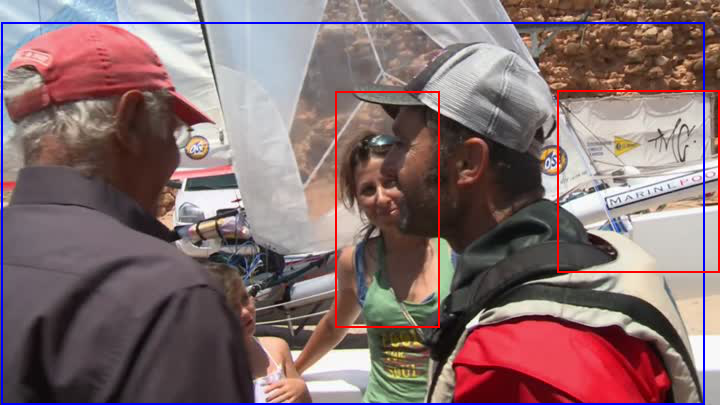

-------------------------------------------
dog
iou: 0.6556251865114892
modified iou: 0.6556251865114892


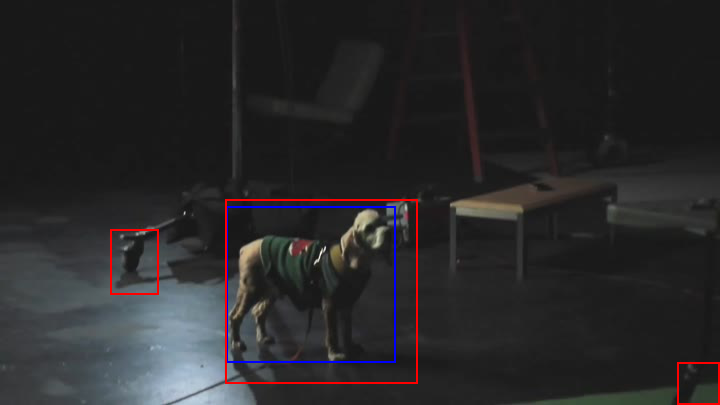

-------------------------------------------
people
iou: 0.06577833236775257
modified iou: 0.3809818801300914


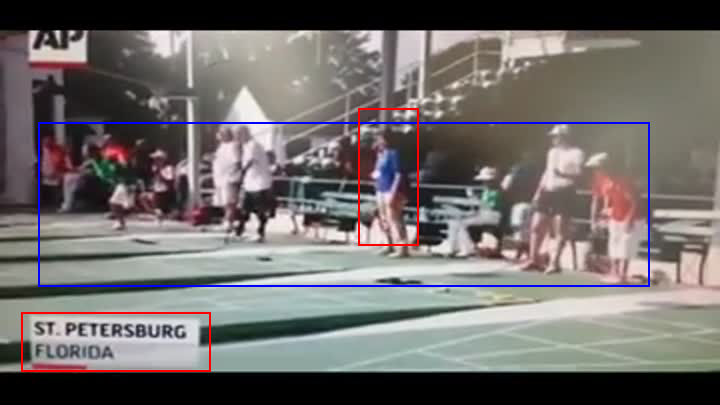

-------------------------------------------
woman
iou: 0.1317365269461078
modified iou: 0.28556335370915403


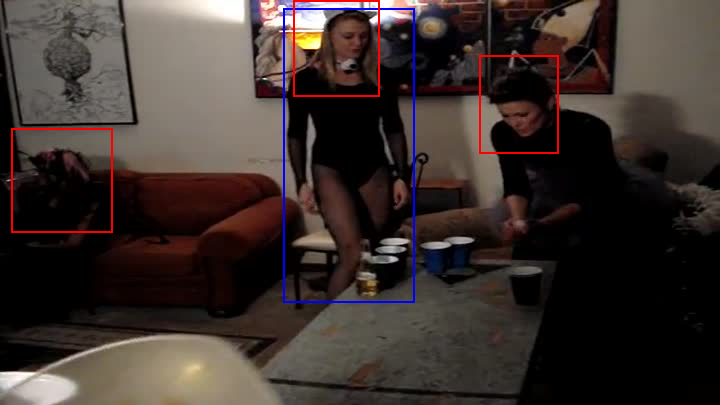

-------------------------------------------
she
iou: 0.013905158392395143
modified iou: 0.02650474675919233


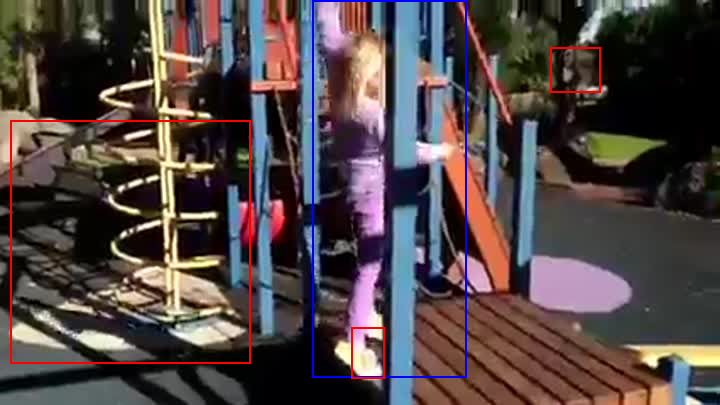

-------------------------------------------
dog
iou: 0.03170958050867452
modified iou: 0.9545454545454546


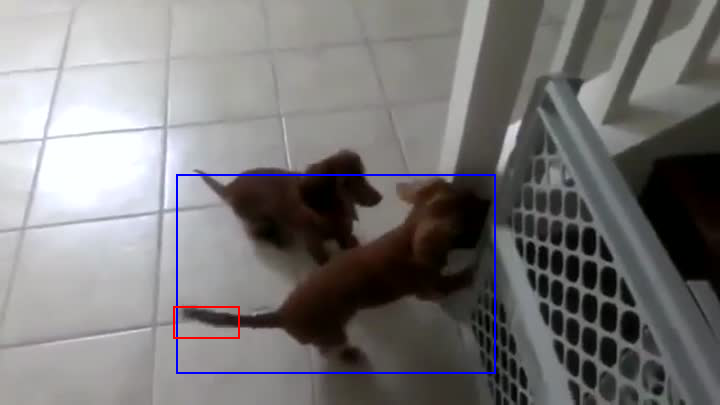

-------------------------------------------
athlete
iou: 0.2527944969905417
modified iou: 0.25432525951557095


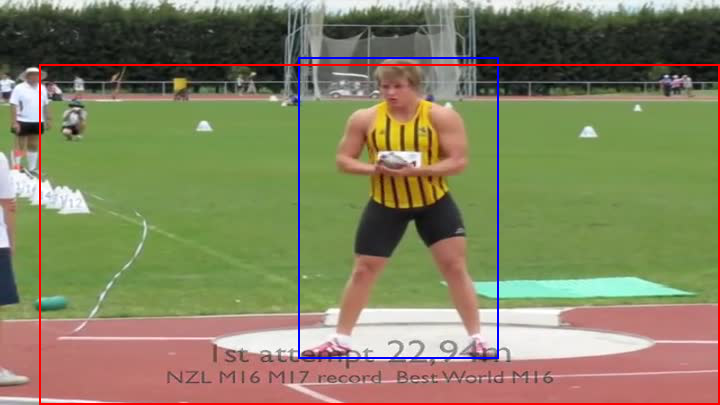

-------------------------------------------
man
iou: 0.09061666405146712
modified iou: 0.38919465348758847


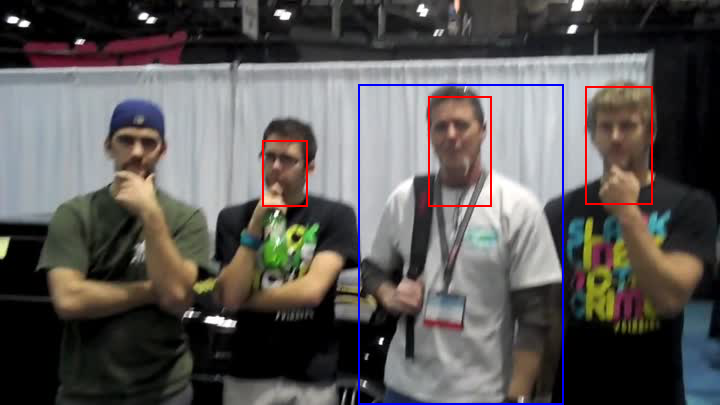

-------------------------------------------
he
iou: 0.02096596765671422
modified iou: 0.1907933630236866


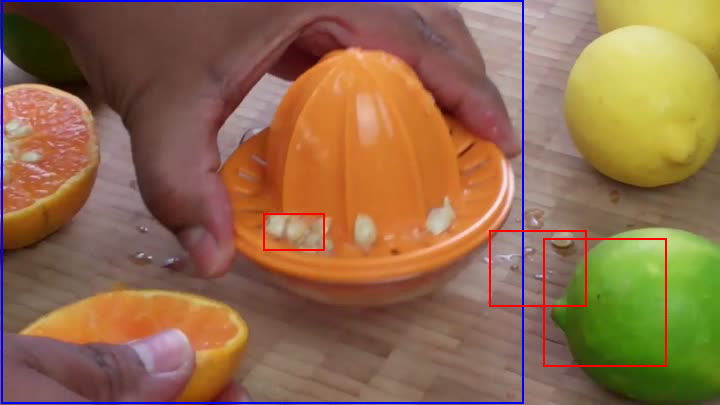

-------------------------------------------
man
iou: 0.08811349017534585
modified iou: 0.08819119851838786


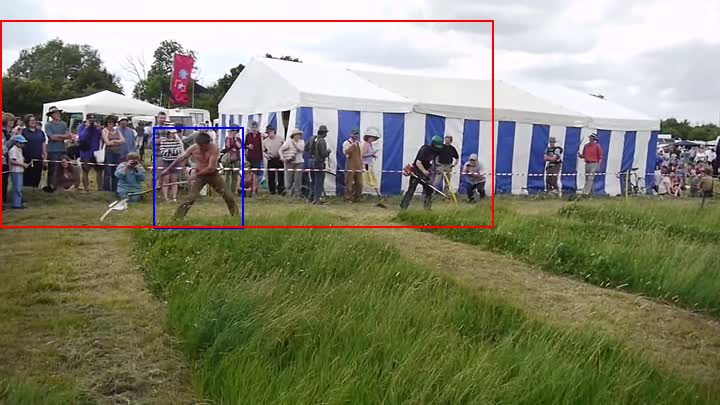

<Figure size 1152x360 with 0 Axes>

In [51]:

plt.figure(figsize=(16, 5))
for i in range(10):

    with Image.open(img_path_list[i]) as im:
        im1 = im.convert('RGB')
        im1 = np.asarray(im).astype(np.float32)
        im1 = im1.resize(())
        print('-------------------------------------------')
        print(cls_list[i])
        print('iou: {}'.format(iou_list[i].item()))
        print('modified iou: {}'.format(mod_iou_list[i].item()))
        draw = ImageDraw.Draw(im)

        draw.rectangle(bb_list[i].squeeze(0).tolist(), outline='blue', width=2)
        for j in range(len(pred_bboxes[i])):
            draw.rectangle(pred_bboxes[i][j].squeeze(0).tolist(), outline='red', width=2)
        im.show()


# VidSitu test

In [18]:
from PIL import Image, ImageDraw
import json
import pprint

In [19]:
pp = pprint.PrettyPrinter(indent=4)

## get multiple frames

In [52]:
from glob import glob, iglob

In [62]:
count = 0
json_list = []

for fn in iglob("/home/jakob/tmp/VidSitu-main/data/vsitu_frames_bbox/*"):
    json_list.append(fn)
    count += 1
    if count >= 43:
        break


In [67]:
len(json_list)

43

for j in json_list:
    f = j.rfind('/')
    fn = j[f:]
    os.system('cp ' + j + ' /dvmm-filer2/users/grace/CLIP/' + fn)
    

In [66]:
for fn in iglob("/dvmm-filer2/users/grace/CLIP/*.json"):
    with open(fn, "r+") as f:
        line = f.read()
        if line[0] == "\"":
            print(fn)
            idx = len(line) - 1
            new_ln = line[1:idx] 
            f.write(new_ln)
            
        

/dvmm-filer2/users/grace/CLIP/v_--b-8xt2PeE_seg_70_80.json
/dvmm-filer2/users/grace/CLIP/v_-1W4xHNKvAk_seg_170_180.json
/dvmm-filer2/users/grace/CLIP/v_-4GsCEopbd4_seg_145_155.json
/dvmm-filer2/users/grace/CLIP/v_-33sUQVbQ24_seg_30_40.json
/dvmm-filer2/users/grace/CLIP/v_--ABd2SeIGE_seg_110_120.json
/dvmm-filer2/users/grace/CLIP/v_--VWN_KTxzE_seg_0_10.json
/dvmm-filer2/users/grace/CLIP/v_-2kcu-IpfoY_seg_0_10.json
/dvmm-filer2/users/grace/CLIP/v_--uyzf7X_0c_seg_105_115.json
/dvmm-filer2/users/grace/CLIP/v_-1gCG8m1SHU_seg_100_110.json
/dvmm-filer2/users/grace/CLIP/v_-1eKufUP5XQ_seg_90_100.json
/dvmm-filer2/users/grace/CLIP/v_-0SHIbuEO3w_seg_55_65.json
/dvmm-filer2/users/grace/CLIP/v_-3cmJe_Kw30_seg_70_80.json
/dvmm-filer2/users/grace/CLIP/v_-3ywc_7_IE8_seg_145_155.json
/dvmm-filer2/users/grace/CLIP/v_-1W4xHNKvAk_seg_80_90.json
/dvmm-filer2/users/grace/CLIP/v_--ifbq2xY6I_seg_150_160.json
/dvmm-filer2/users/grace/CLIP/v_-2KGPYEFnsU_seg_25_35.json
/dvmm-filer2/users/grace/CLIP/v_-2kcu-IpfoY

In [68]:
json_list = []
for fn in iglob("/dvmm-filer2/users/grace/CLIP/*.json"):
    json_list.append(fn)
print(len(json_list))

51


In [69]:
json_list = json_list[:50]
print(len(json_list))

50


In [72]:
bb_list = []
cls_list = []
img_list = []
img_path_list = []
img_dim_list = []

for j in json_list:
    frame_dict = None
    
    with open(j, "r") as f:
        frame_dict = json.load(f)
    print(j)
    test_frame = frame_dict[0]
    test_img_path = test_frame['image_path']
    img_path_list.append(test_img_path)
    
    x = Image.open(os.path.join(skimage.data_dir, test_img_path)).convert("RGB")
    
    """
    img_dim_list.append(x.size)
    
    preprocess = Compose([
        Resize(x.size, interpolation=Image.BICUBIC),
        ToTensor()
    ])
    """
    test_image = preprocess(x)
    
    bb_list.append(test_frame['boxes'][1]['bbox'])
    cls_list.append(test_frame['boxes'][1]['cls'])
    img_list.append(test_image)

JSONDecodeError: Extra data: line 1 column 35867 (char 35866)

In [27]:
print(cls_list)

['hair', 'woman', 'shirt', 'ear', 'scissors', 'hand', 'man']


In [148]:
image_input = torch.tensor(np.stack(img_list)).cuda()
image_input -= image_mean[:, None, None]
image_input /= image_std[:, None, None]

In [149]:
tokenizer = SimpleTokenizer()
text_tokens = [tokenizer.encode("This is a " + desc) for desc in cls_list]

In [159]:
text_input = torch.zeros(len(text_tokens), model_modded.context_length, dtype=torch.long)
sot_token = tokenizer.encoder['<|startoftext|>']
eot_token = tokenizer.encoder['<|endoftext|>']

for i, tokens in enumerate(text_tokens):
    tokens = [sot_token] + tokens + [eot_token]
    text_input[i, :len(tokens)] = torch.tensor(tokens)

text_input = text_input.cuda()

In [160]:
with torch.no_grad():
    image_features = model_modded.encode_image(image_input).float()
    text_features = model_modded.encode_text(text_input).float()

output size:  torch.Size([50, 7, 1024])


In [161]:
img_fts = image_features[1:]
print(img_fts.size())

torch.Size([49, 7, 1024])


7
torch.Size([7, 7, 7, 1024])
torch.Size([7, 1024])
0.17794065
0.20030648
0.16010337
0.14834064
0.19381696
0.23138162
0.18574928
[{'score': 0.98182863, 'bbox': (0, 58, 223, 223), 'bbox_normalized': array([0.        , 0.25892857, 0.99553571, 0.99553571])}]
0 58 223 165


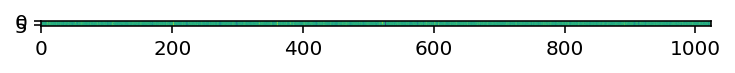

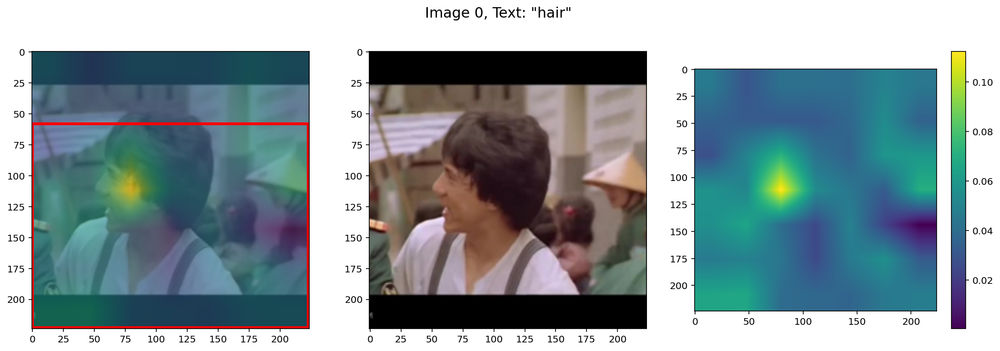

[{'score': 0.98661506, 'bbox': (20, 45, 79, 132), 'bbox_normalized': array([0.08928571, 0.20089286, 0.35267857, 0.58928571])}]
20 45 59 87


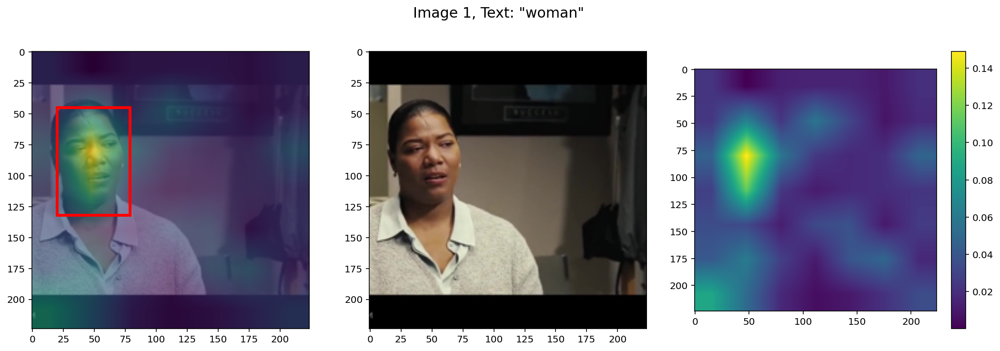

[{'score': 0.9886769, 'bbox': (26, 28, 121, 97), 'bbox_normalized': array([0.11607143, 0.125     , 0.54017857, 0.43303571])}, {'score': 0.9496587, 'bbox': (144, 179, 223, 223), 'bbox_normalized': array([0.64285714, 0.79910714, 0.99553571, 0.99553571])}, {'score': 0.72502315, 'bbox': (0, 162, 91, 223), 'bbox_normalized': array([0.        , 0.72321429, 0.40625   , 0.99553571])}]
26 28 95 69
144 179 79 44
0 162 91 61


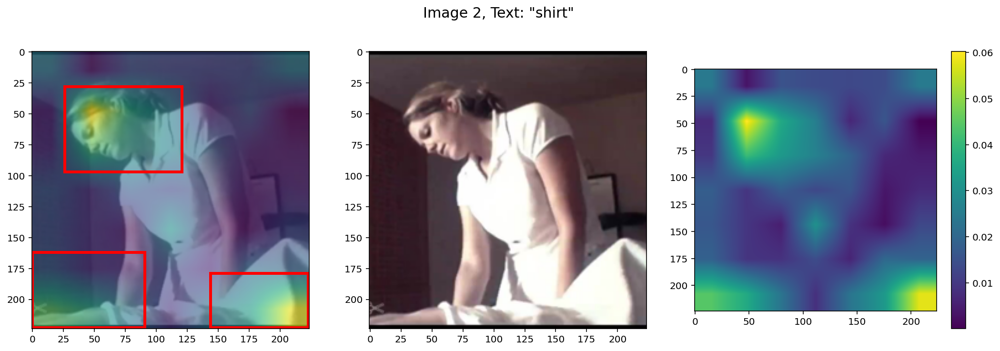

[{'score': 0.990382, 'bbox': (0, 187, 46, 223), 'bbox_normalized': array([0.        , 0.83482143, 0.20535714, 0.99553571])}]
0 187 46 36


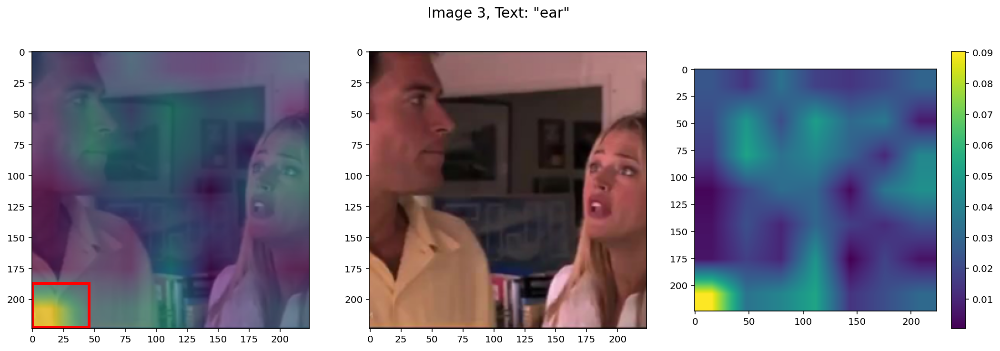

[{'score': 0.72264975, 'bbox': (0, 0, 223, 223), 'bbox_normalized': array([0.        , 0.        , 0.99553571, 0.99553571])}]
0 0 223 223


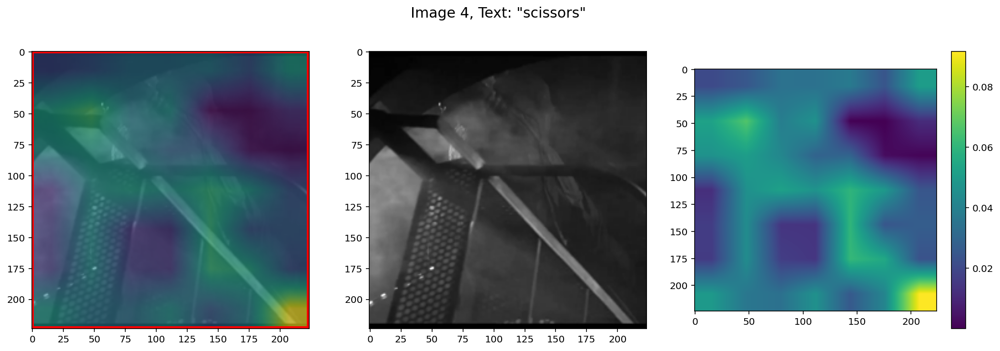

[{'score': 0.9869259, 'bbox': (19, 0, 223, 223), 'bbox_normalized': array([0.08482143, 0.        , 0.99553571, 0.99553571])}]
19 0 204 223


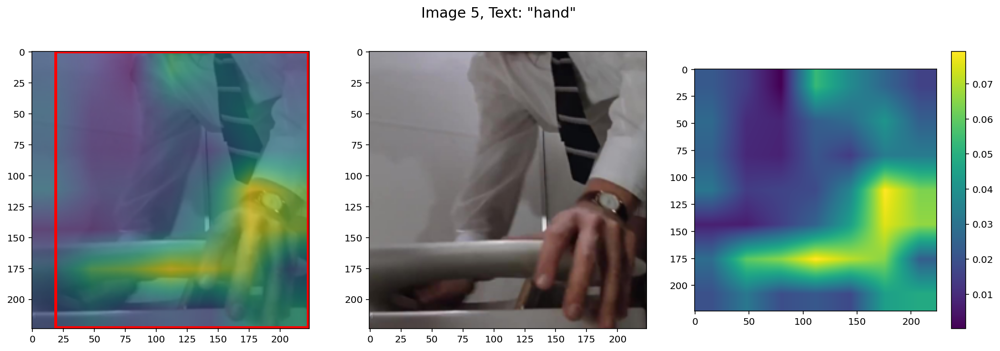

[{'score': 0.99660957, 'bbox': (0, 160, 68, 223), 'bbox_normalized': array([0.        , 0.71428571, 0.30357143, 0.99553571])}, {'score': 0.80268353, 'bbox': (118, 35, 223, 140), 'bbox_normalized': array([0.52678571, 0.15625   , 0.99553571, 0.625     ])}]
0 160 68 63
118 35 105 105


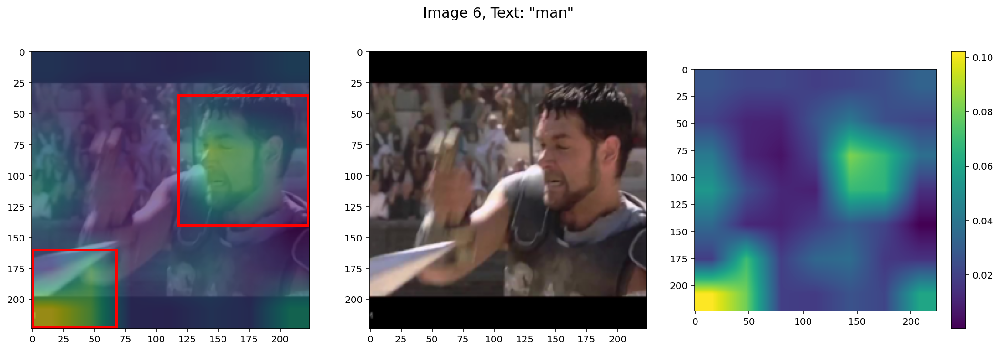

In [164]:
heatmap_list = img_fts_to_heatmap(img_fts, text_features)
for h in range(len(heatmap_list)):
    title = "Image " + str(h) + ", Text: \"" + cls_list[h] + "\""
    heat = heatmap_list[h]
    bboxes = heat2bbox(heat, input_resolution)
    print(bboxes)
    img_heat_bbox_disp(img_list[h].permute(1, 2, 0), heat, title=title, bboxes=bboxes, order='xyxy') 

-------------------------------------------
hair


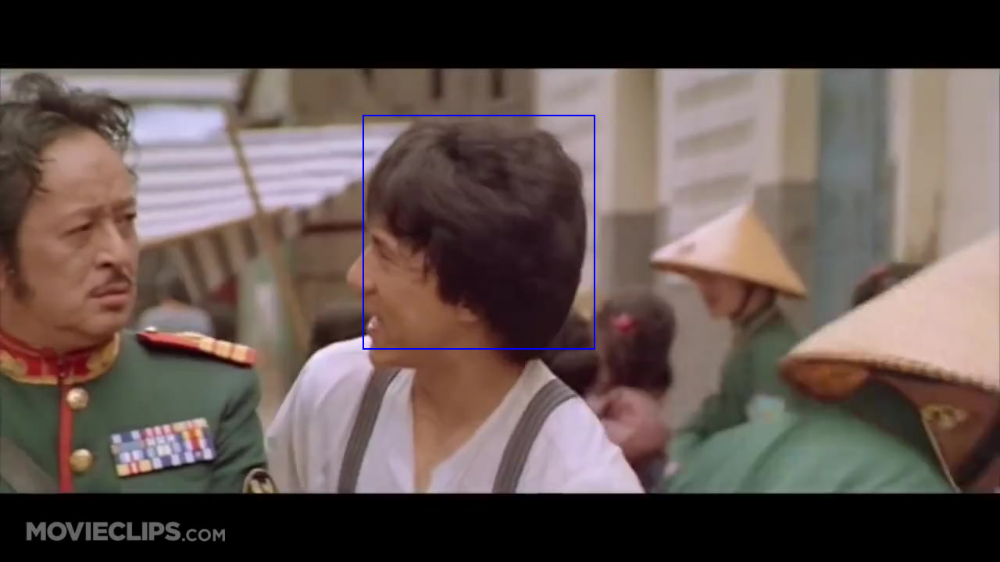

-------------------------------------------
woman


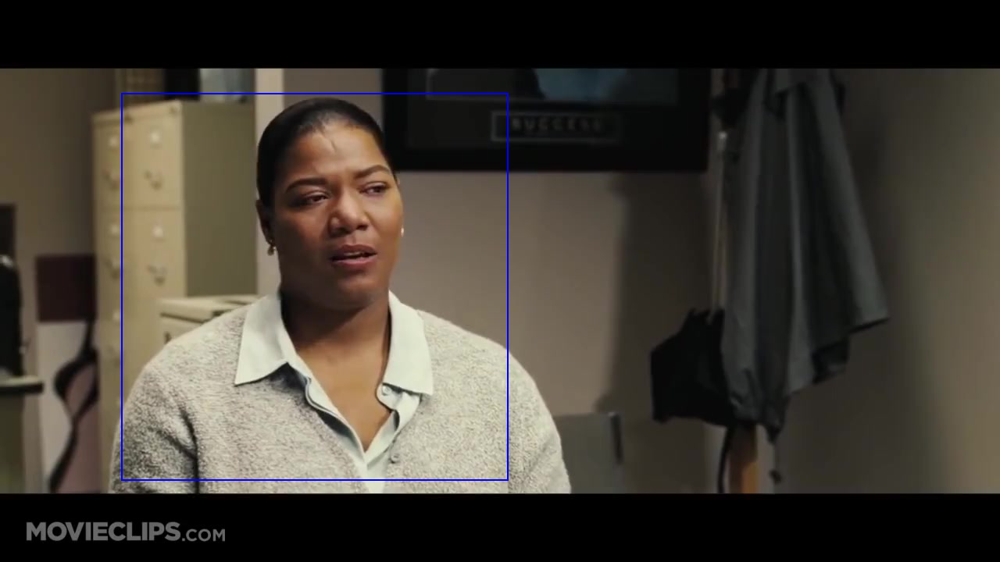

-------------------------------------------
shirt


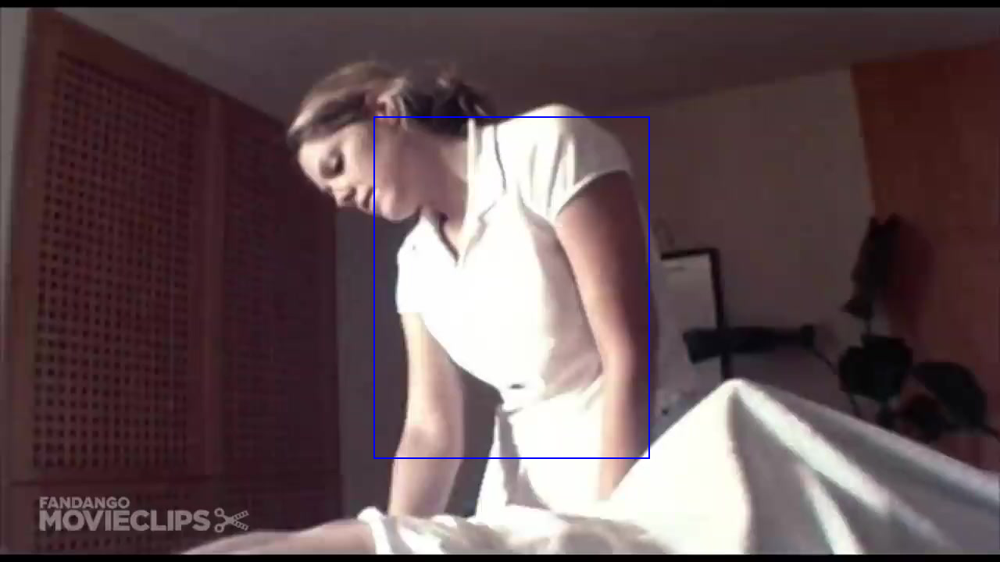

-------------------------------------------
ear


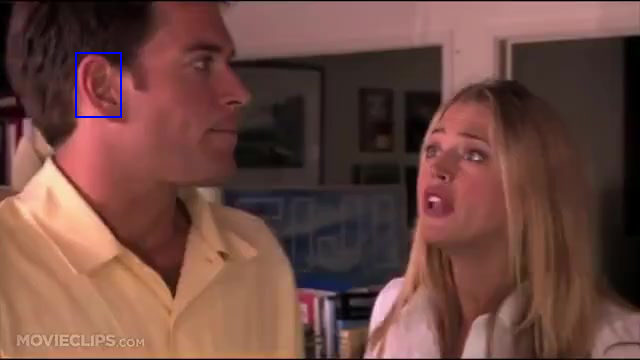

-------------------------------------------
scissors


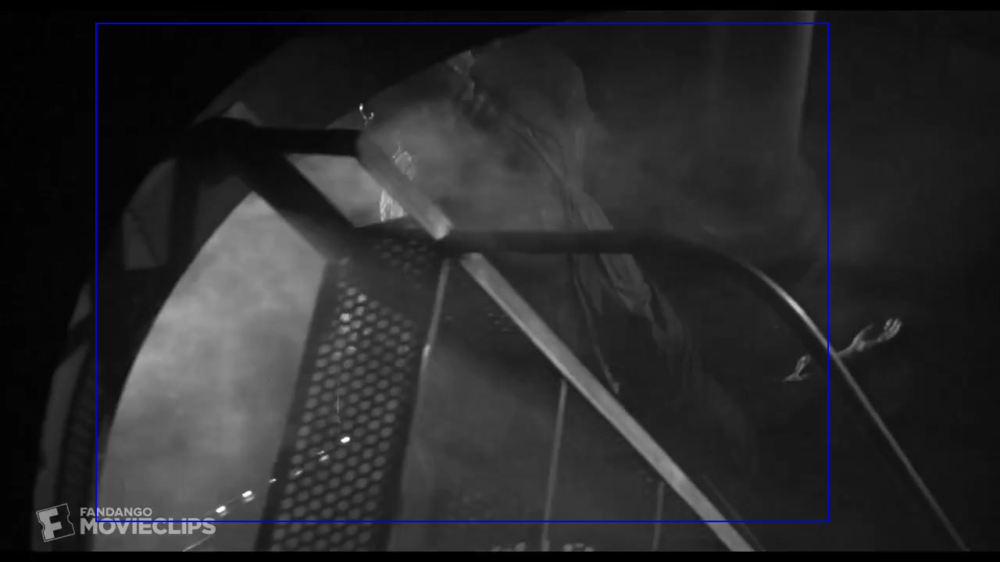

-------------------------------------------
hand


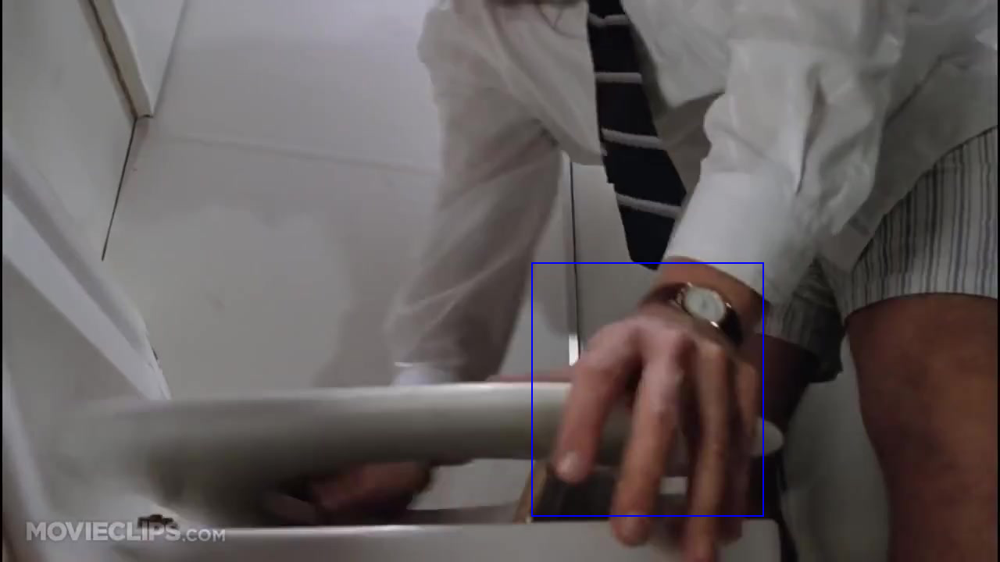

-------------------------------------------
man


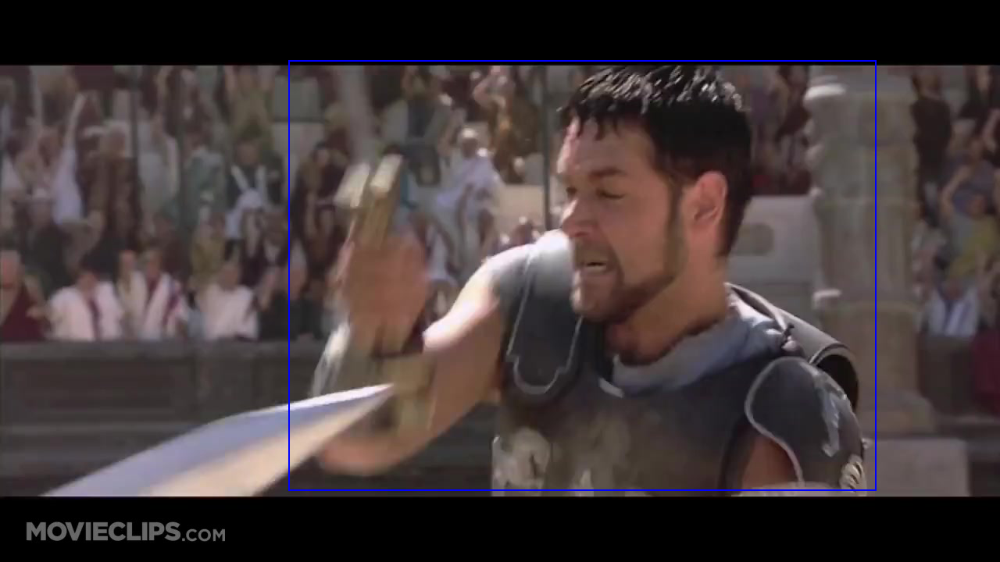

<Figure size 1152x360 with 0 Axes>

In [168]:
plt.figure(figsize=(16, 5))
for i in range(len(cls_list)):

    with Image.open(img_path_list[i]) as im:
        im1 = im.convert('RGB')
        im1 = np.asarray(im).astype(np.float32)
        im1 = im1.resize(())
        print('-------------------------------------------')
        print(cls_list[i])
        draw = ImageDraw.Draw(im)

        draw.rectangle(bb_list[i], outline='blue', width=2)
        im.show()